In [5]:
import pandas as pd
import numpy as np
import pingouin as pg
from scipy.stats import shapiro
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import json

# analy to the gaze data

In [77]:
file_path = 'D:\eyetracking\experiment1_Data.xlsx'

rawdata = pd.read_excel(file_path)
data = pd.DataFrame(rawdata)
data

<>:1: SyntaxWarning: invalid escape sequence '\e'
<>:1: SyntaxWarning: invalid escape sequence '\e'
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\665349265.py:1: SyntaxWarning: invalid escape sequence '\e'
  file_path = 'D:\eyetracking\experiment1_Data.xlsx'


,trial_index,stimulus_url,congruency,response,reaction_time,gaze_data
0,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,"[{""x"":447.09133168790356,""y"":352.1836687710343..."
1,1,https://Choiseonwoo927.github.io/Eyetracking/c...,cong_same,z,1244.9,"[{""x"":705.0482173103093,""y"":407.197240953926,""..."
2,2,https://Choiseonwoo927.github.io/Eyetracking/c...,congruent,z,1130.6,"[{""x"":497.2383319942278,""y"":470.2786688742431,..."
3,3,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1154.1,"[{""x"":624.3396077783036,""y"":491.64984000101754..."
4,4,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1518.6,"[{""x"":767.0938486074823,""y"":611.070295647574,""..."
...,...,...,...,...,...,...
4731,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1055.7,"[{""x"":719.8947918606772,""y"":347.90296582333065..."
4732,124,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1232.1,"[{""x"":-156.20409773073683,""y"":232.548888143327..."
4733,125,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1073.3,"[{""x"":564.0371419667847,""y"":180.6260623367746,..."
4734,126,https://Choiseonwoo927.github.io/Eyetracking/c...,cong_same,z,1022.3,"[{""x"":643.3597957076549,""y"":185.93737027496684..."


In [78]:
def parse_gaze_data(json_string):
    """JSON 문자열을 파이썬 리스트로 변환합니다."""
    if pd.isna(json_string) or not isinstance(json_string, str):
        return []
    try:
        return json.loads(json_string)
    except json.JSONDecodeError:
        return []

In [79]:
data['gaze_list'] = data['gaze_data'].apply(parse_gaze_data)

data_list = data.explode('gaze_list').reset_index(drop=True)

data_normalized = pd.json_normalize(data_list['gaze_list'])

data_final = pd.concat([data_list.drop(['gaze_data', 'gaze_list'], axis=1), data_normalized], axis=1)
data_final

,trial_index,stimulus_url,congruency,response,reaction_time,x,y,time
0,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,447.091332,352.183669,202656.6
1,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,458.322536,332.736726,202711.8
2,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,461.563622,348.085456,202772.4
3,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,456.541456,325.864055,202820.0
4,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,448.719613,345.242698,202889.7
...,...,...,...,...,...,...,...,...
98734,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,357.329818,209.152778,247818.6
98735,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,331.662655,242.888881,247869.3
98736,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,279.345286,240.133816,247917.6
98737,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,103.524981,255.741606,247970.8


In [80]:
incong_gaze = data_final[data_final['congruency'] == 'incongruent']
cong_gaze = data_final[data_final['congruency'] == 'congruent']
incong_same_gaze = data_final[data_final['congruency'] == 'incong_same']
cong_same_gaze = data_final[data_final['congruency'] == 'cong_same']

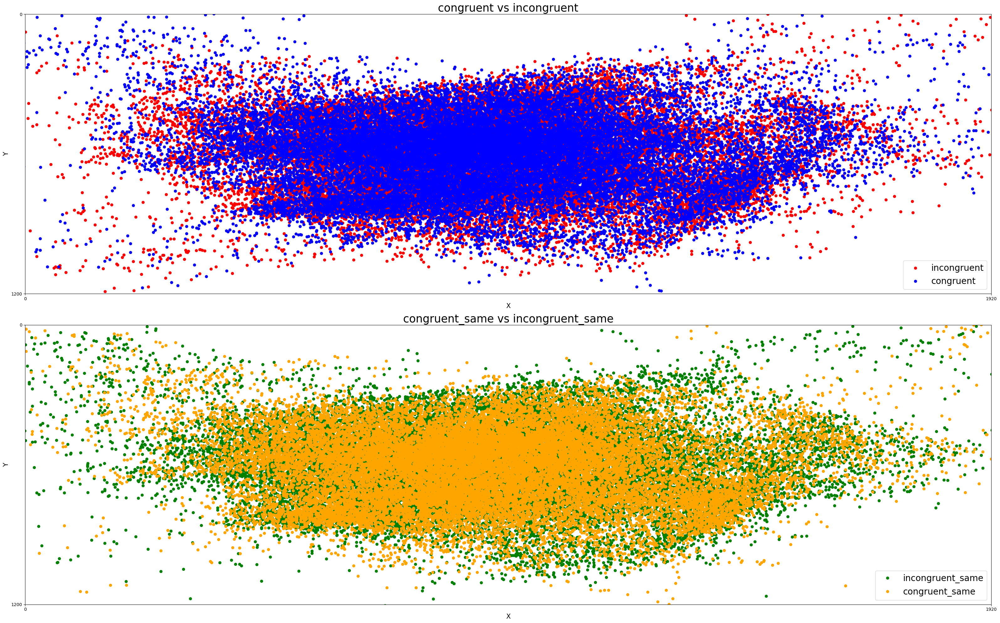

In [695]:
fig = plt.figure(figsize=(32, 20))

plt.subplot(2, 1, 1)
plt.plot(incong_gaze['x'], incong_gaze['y'], 'o', color='red', label = 'incongruent')
plt.plot(cong_gaze['x'], cong_gaze['y'], 'o', color='blue', label = 'congruent')

plt.xlim(0, 1920)
plt.ylim(1200, 0)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.title('congruent vs incongruent', fontsize=25)
plt.xlabel('X', fontsize=15)
plt.ylabel('Y', fontsize=15)
plt.legend(fontsize=20)

plt.subplot(2, 1, 2)
plt.plot(incong_same_gaze['x'], incong_same_gaze['y'], 'o', color='green', label = 'incongruent_same')
plt.plot(cong_same_gaze['x'], cong_same_gaze['y'], 'o', color='orange', label = 'congruent_same')

plt.xlim(0, 1920)
plt.ylim(1200, 0)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.title('congruent_same vs incongruent_same', fontsize=25)
plt.xlabel('X', fontsize=15)
plt.ylabel('Y', fontsize=15)
plt.legend(fontsize=20, loc = "lower right")

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure1.png', dpi = 150)

plt.show()


In [82]:
cond_rawdata = pd.read_excel('D:\eyetracking\experiment1_cond.xlsx')
cond_data = pd.DataFrame(cond_rawdata)
cond_data

<>:1: SyntaxWarning: invalid escape sequence '\e'
<>:1: SyntaxWarning: invalid escape sequence '\e'
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\544984753.py:1: SyntaxWarning: invalid escape sequence '\e'
  cond_rawdata = pd.read_excel('D:\eyetracking\experiment1_cond.xlsx')


,trial_index,stimulus_url,congruency,response,reaction_time,gaze_data,cond_file,cond_stim
0,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,"[{""x"":447.09133168790356,""y"":352.1836687710343...",word_image057.jpg,word_image
1,1,https://Choiseonwoo927.github.io/Eyetracking/c...,cong_same,z,1244.9,"[{""x"":705.0482173103093,""y"":407.197240953926,""...",image_word065.jpg,image_word
2,2,https://Choiseonwoo927.github.io/Eyetracking/c...,congruent,z,1130.6,"[{""x"":497.2383319942278,""y"":470.2786688742431,...",word_image019.jpg,word_image
3,3,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1154.1,"[{""x"":624.3396077783036,""y"":491.64984000101754...",word_image062.jpg,word_image
4,4,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1518.6,"[{""x"":767.0938486074823,""y"":611.070295647574,""...",word_image116.jpg,word_image
...,...,...,...,...,...,...,...,...
4731,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1055.7,"[{""x"":719.8947918606772,""y"":347.90296582333065...",NaN,NaN
4732,124,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1232.1,"[{""x"":-156.20409773073683,""y"":232.548888143327...",NaN,NaN
4733,125,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1073.3,"[{""x"":564.0371419667847,""y"":180.6260623367746,...",NaN,NaN
4734,126,https://Choiseonwoo927.github.io/Eyetracking/c...,cong_same,z,1022.3,"[{""x"":643.3597957076549,""y"":185.93737027496684...",NaN,NaN


In [83]:
cond_data = cond_data.drop(['cond_file'], axis = 1)
cond_data

,trial_index,stimulus_url,congruency,response,reaction_time,gaze_data,cond_stim
0,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,"[{""x"":447.09133168790356,""y"":352.1836687710343...",word_image
1,1,https://Choiseonwoo927.github.io/Eyetracking/c...,cong_same,z,1244.9,"[{""x"":705.0482173103093,""y"":407.197240953926,""...",image_word
2,2,https://Choiseonwoo927.github.io/Eyetracking/c...,congruent,z,1130.6,"[{""x"":497.2383319942278,""y"":470.2786688742431,...",word_image
3,3,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1154.1,"[{""x"":624.3396077783036,""y"":491.64984000101754...",word_image
4,4,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1518.6,"[{""x"":767.0938486074823,""y"":611.070295647574,""...",word_image
...,...,...,...,...,...,...,...
4731,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1055.7,"[{""x"":719.8947918606772,""y"":347.90296582333065...",NaN
4732,124,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1232.1,"[{""x"":-156.20409773073683,""y"":232.548888143327...",NaN
4733,125,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1073.3,"[{""x"":564.0371419667847,""y"":180.6260623367746,...",NaN
4734,126,https://Choiseonwoo927.github.io/Eyetracking/c...,cong_same,z,1022.3,"[{""x"":643.3597957076549,""y"":185.93737027496684...",NaN


In [84]:
cond_data['gaze_list'] = cond_data['gaze_data'].apply(parse_gaze_data)

conddata_list = cond_data.explode('gaze_list').reset_index(drop=True)

conddata_normalized = pd.json_normalize(conddata_list['gaze_list'])

conddata_final = pd.concat([conddata_list.drop(['gaze_data', 'gaze_list'], axis=1), conddata_normalized], axis=1)
conddata_final

,trial_index,stimulus_url,congruency,response,reaction_time,cond_stim,x,y,time
0,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,word_image,447.091332,352.183669,202656.6
1,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,word_image,458.322536,332.736726,202711.8
2,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,word_image,461.563622,348.085456,202772.4
3,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,word_image,456.541456,325.864055,202820.0
4,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1116.9,word_image,448.719613,345.242698,202889.7
...,...,...,...,...,...,...,...,...,...
98734,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,NaN,357.329818,209.152778,247818.6
98735,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,NaN,331.662655,242.888881,247869.3
98736,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,NaN,279.345286,240.133816,247917.6
98737,127,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,986.3,NaN,103.524981,255.741606,247970.8


In [85]:
word_image = conddata_final[conddata_final['cond_stim'] == 'word_image']
image_word = conddata_final[conddata_final['cond_stim'] == 'image_word']

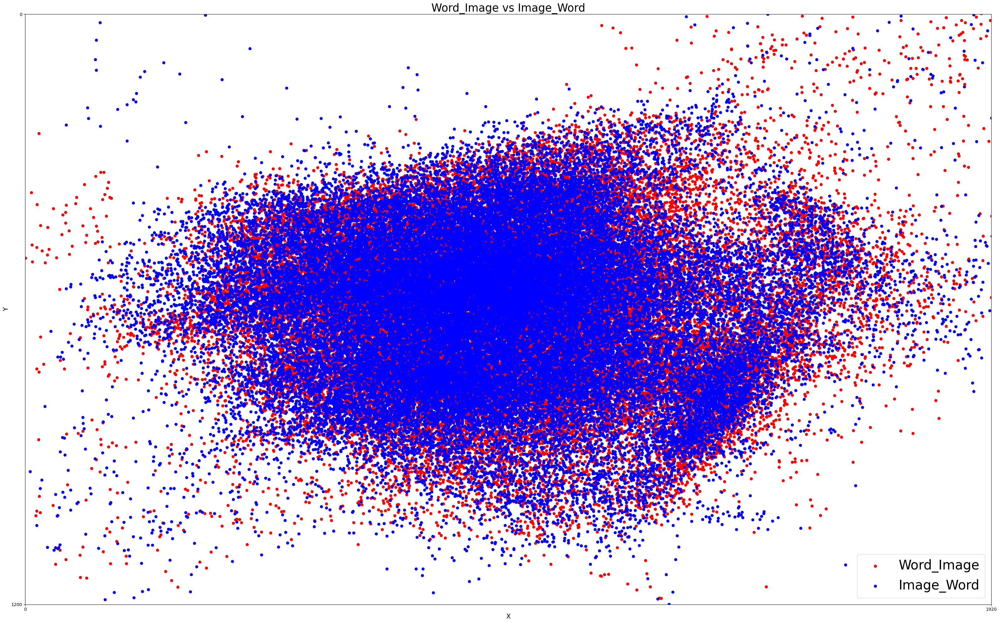

In [694]:
fig = plt.figure(figsize=(32, 20))

plt.scatter(word_image['x'], word_image['y'], color='red', label = 'Word_Image')
plt.scatter(image_word['x'], image_word['y'], color='blue', label = 'Image_Word')

plt.xlim(0, 1920)
plt.ylim(1200, 0)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.title('Word_Image vs Image_Word', fontsize=25)
plt.xlabel('X', fontsize=15)
plt.ylabel('Y', fontsize=15)

plt.legend(fontsize=30)
plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure2.png', dpi = 150)
plt.show()

In [87]:
x1min = 560
x1max = x1min + 360
y1min = 300 + 120
y1max = y1min + 360

x2min = x1max + 80
x2max = x2min + 360
y2min = y1min
y2max = y1max

word_imagex_left = (word_image['x'] >= x1min) & (word_image['x'] <= x1max)
word_imagey_left = (word_image['y'] >= y1min) & (word_image['y'] <= y1max)
word_imagex_right = (word_image['x'] >= x2min) & (word_image['x'] <= x2max)
word_imagey_right = (word_image['y'] >= y2min) & (word_image['y'] <= y2max)

image_wordx_left = (image_word['x'] >= x1min) & (image_word['x'] <= x1max)
image_wordy_left = (image_word['y'] >= y1min) & (image_word['y'] <= y1max)
image_wordx_right = (image_word['x'] >= x2min) & (image_word['x'] <= x2max)
image_wordy_right = (image_word['y'] >= y2min) & (image_word['y'] <= y2max)

word_image_left = word_image[word_imagex_left & word_imagey_left]
word_image_right = word_image[word_imagex_right & word_imagey_right]
image_word_left = image_word[image_wordx_left & image_wordy_left]
image_word_right = image_word[image_wordx_right & image_wordy_right]

In [88]:
word_image_left_gaze = word_image_left.groupby('trial_index').size().reset_index(name='counts')
word_image_right_gaze = word_image_right.groupby('trial_index').size().reset_index(name='counts')

word_image_left_gaze['conditions'] = 'Left'
word_image_right_gaze['conditions'] = 'Right'

word_image_gaze = pd.concat([word_image_left_gaze, word_image_right_gaze], axis=0)

word_image_gaze

,trial_index,counts,conditions
0,0,109,Left
1,1,161,Left
2,2,87,Left
3,3,112,Left
4,4,58,Left
...,...,...,...
123,123,67,Right
124,124,50,Right
125,125,35,Right
126,126,77,Right


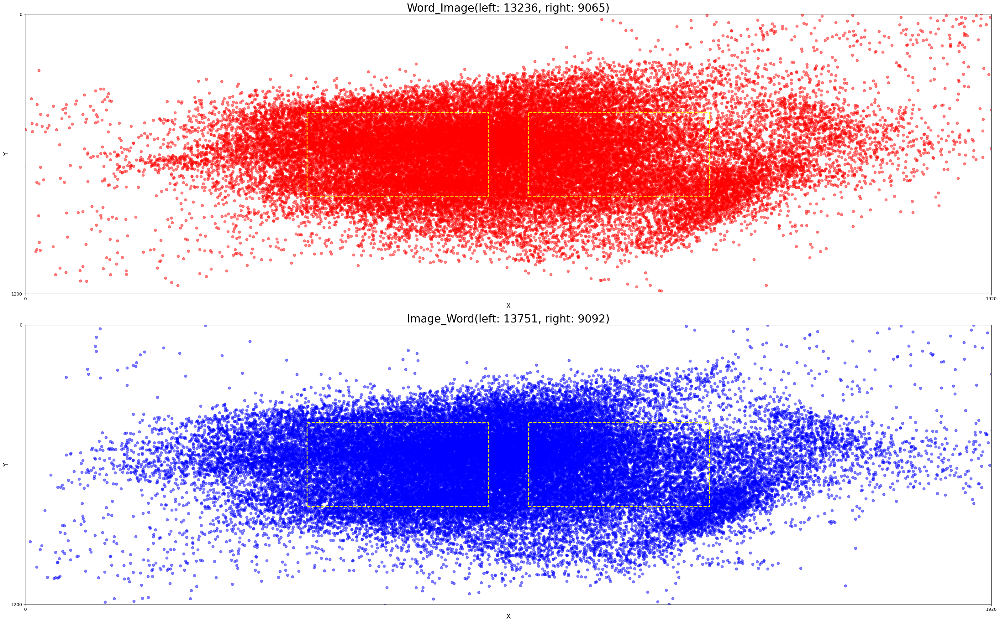

In [696]:
fig = plt.figure(figsize=(32, 20))

plt.subplot(2, 1, 1)
plt.scatter(word_image['x'], word_image['y'], color='red', label = 'Word_Image', alpha = 0.5)

roi_rect1 = Rectangle(
    (x1min, y1min), 
    x1max - x1min, # width
    y1max - y1min, # height
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

roi_rect2 = Rectangle(
    (x2min, y2min), 
    x2max - x2min, 
    y2max - y2min, 
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

plt.gca().add_patch(roi_rect1)
plt.gca().add_patch(roi_rect2)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.gca().invert_yaxis()

plt.title(f'Word_Image(left: {len(word_image_left)}, right: {len(word_image_right)})', fontsize=25)
plt.xlabel('X', fontsize=15)
plt.ylabel('Y', fontsize=15)

plt.subplot(2, 1, 2)
plt.scatter(image_word['x'], image_word['y'], color='blue', label = 'Image_Word', alpha = 0.5)

roi_rect1 = Rectangle(
    (x1min, y1min), 
    x1max - x1min, 
    y1max - y1min, 
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

roi_rect2 = Rectangle(
    (x2min, y2min), 
    x2max - x2min, 
    y2max - y2min, 
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.gca().invert_yaxis()

plt.title(f'Image_Word(left: {len(image_word_left)}, right: {len(image_word_right)})', fontsize=25)
plt.xlabel('X', fontsize=15)
plt.ylabel('Y', fontsize=15)

plt.gca().add_patch(roi_rect1)
plt.gca().add_patch(roi_rect2)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure3.png', dpi = 150)

plt.show()

In [697]:
import scipy.stats as stats

word_image_total = len(word_image_left) + len(word_image_right)
word_image_ob_counts = np.array([len(word_image_left), len(word_image_right)])
word_image_exp_counts = np.array([word_image_total/2, word_image_total/2])

chi2_stat1, p_value1 = stats.chisquare(word_image_ob_counts, word_image_exp_counts)

print(f'word_image = chi2_stat: {chi2_stat1:.3f}, p_value: {p_value1:.3f}')

image_word_total = len(image_word_left) + len(image_word_right)
image_word_ob_counts = np.array([len(image_word_left), len(image_word_right)])
image_word_exp_counts = np.array([image_word_total/2, image_word_total/2])

chi2_stat2, p_value2 = stats.chisquare(image_word_ob_counts, image_word_exp_counts)

print(f'image_word = chi2_stat: {chi2_stat2:.3f}, p_value: {p_value2:.3f}')

word_image = chi2_stat: 780.110, p_value: 0.000
image_word = chi2_stat: 950.238, p_value: 0.000


In [698]:
left_total = len(word_image_left) + len(image_word_left)
left_ob_counts = np.array([len(word_image_left), len(image_word_left)])
left_exp_counts = np.array([left_total/2, left_total/2])

chi2_stat3, p_value3 = stats.chisquare(left_ob_counts, left_exp_counts)

print(f'left = chi2_stat: {chi2_stat3:.3f}, p_value: {p_value3:.3f}')

right_total = len(word_image_right) + len(image_word_right)
right_ob_counts = np.array([len(word_image_right), len(image_word_right)])
right_exp_counts = np.array([right_total/2, right_total/2])

chi2_stat4, p_value4 = stats.chisquare(right_ob_counts, right_exp_counts)

print(f'right = chi2_stat: {chi2_stat4:.3f}, p_value: {p_value4:.3f}')

left = chi2_stat: 9.828, p_value: 0.002
right = chi2_stat: 0.040, p_value: 0.841


In [699]:
cond_total = len(conddata_final[conddata_final['congruency']=='congruent']) + len(conddata_final[conddata_final['congruency']=='incongruent'])
cond_ob_counts = np.array([len(conddata_final[conddata_final['congruency']=='congruent']), len(conddata_final[conddata_final['congruency']=='incongruent'])])
cond_exp_counts = np.array([cond_total/2, cond_total/2])

chi2_stat5, p_value5 = stats.chisquare(cond_ob_counts, cond_exp_counts)

print(f'cond = chi2_stat: {chi2_stat5:.3f}, p_value: {p_value5:.3f}')

cond = chi2_stat: 77.158, p_value: 0.000


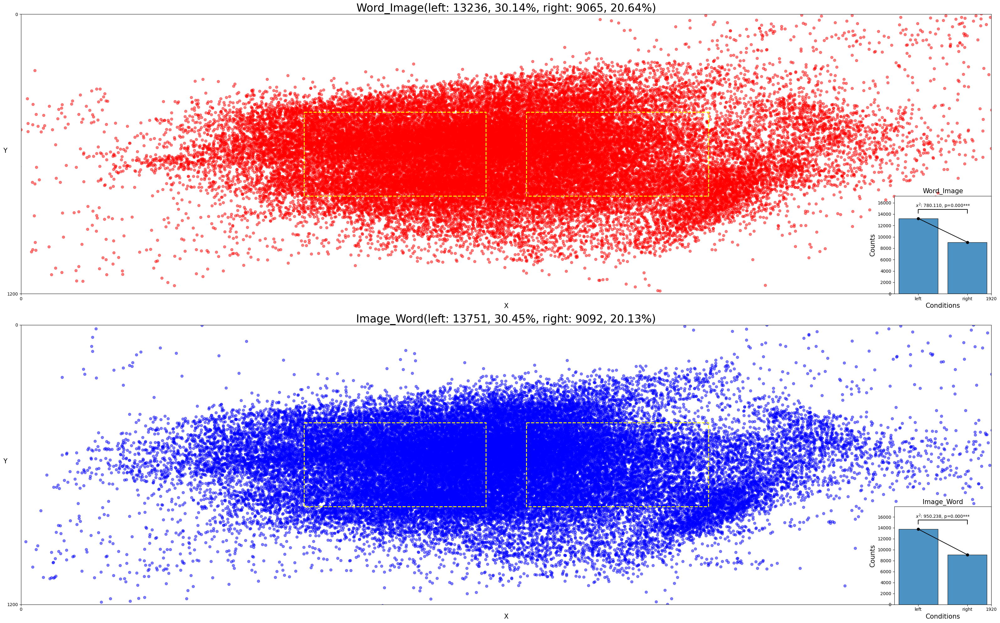

In [700]:
fig = plt.figure(figsize=(32, 20))

ax1 = fig.add_subplot(2, 1, 1)

ax1.scatter(word_image['x'], word_image['y'], color='red', label = 'Word_Image', alpha = 0.5)

word_image_left_prop = len(word_image_left) / len(word_image) * 100
word_image_right_prop = len(word_image_right) / len(word_image) * 100

roi_rect1 = Rectangle(
    (x1min, y1min), 
    x1max - x1min, # width
    y1max - y1min, # height
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

roi_rect2 = Rectangle(
    (x2min, y2min), 
    x2max - x2min, 
    y2max - y2min, 
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

ax1.add_patch(roi_rect1)
ax1.add_patch(roi_rect2)

ax1.set_xlim(0, 1920)
ax1.set_ylim(0, 1200)
ax1.set_xticks([0, 1920])
ax1.set_yticks([1200, 0])

ax1.invert_yaxis()

ax1.set_title(f'Word_Image(left: {len(word_image_left)}, {word_image_left_prop:.2f}%, right: {len(word_image_right)}, {word_image_right_prop:.2f}%)', fontsize=25)
ax1.set_xlabel('X', fontsize=15)
ax1.set_ylabel('Y', fontsize=15, rotation = 0)

ax_inset1 = ax1.inset_axes([0.9, 0, 0.1, 0.35]) # left, bottom, width, height

ax_inset1.bar([0, 1], [len(word_image_left), len(word_image_right)], alpha = 0.8, 
        edgecolor = 'black');
ax_inset1.plot([0, 1], [len(word_image_left), len(word_image_right)], 'o-', color='black')

ax_inset1.plot(
    [0, 0, 1, 1],
    [len(word_image_left)*1.07, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07],
    lw = 1.5, c = 'black'
)

ax_inset1.text(
    0.5,
    (len(word_image_left)*1.07+len(word_image_left)*0.05+len(word_image_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat1:.3f}, p={p_value1:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 10,
    color = 'black'
)

ax_inset1.set_xlabel('Conditions', fontsize=15);
ax_inset1.set_ylabel('Counts', fontsize=15);
ax_inset1.set_title('Word_Image', fontsize=15);

ax_inset1.set_xticks([0, 1], ['left', 'right']);
ax_inset1.set_ylim([0, len(word_image_left)*1.3])

ax2 = fig.add_subplot(2, 1, 2)

ax2.scatter(image_word['x'], image_word['y'], color='blue', label = 'Image_Word', alpha = 0.5)

image_word_left_prop = len(image_word_left) / len(image_word) * 100
image_word_right_prop = len(image_word_right) / len(image_word) * 100 

roi_rect1 = Rectangle(
    (x1min, y1min), 
    x1max - x1min, 
    y1max - y1min, 
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

roi_rect2 = Rectangle(
    (x2min, y2min), 
    x2max - x2min, 
    y2max - y2min, 
    edgecolor='yellow', 
    facecolor='none', 
    linewidth=2,
    linestyle='--'
)

ax2.set_xlim(0, 1920)
ax2.set_ylim(0, 1200)
ax2.set_xticks([0, 1920])
ax2.set_yticks([1200, 0])

ax2.invert_yaxis()

ax2.set_title(f'Image_Word(left: {len(image_word_left)}, {image_word_left_prop:.2f}%, right: {len(image_word_right)}, {image_word_right_prop:.2f}%)', fontsize=25)
ax2.set_xlabel('X', fontsize=15)
ax2.set_ylabel('Y', fontsize=15, rotation = 0)

ax2.add_patch(roi_rect1)
ax2.add_patch(roi_rect2)

ax_inset2 = ax2.inset_axes([0.9, 0, 0.1, 0.35])

ax_inset2.bar([0, 1], [len(image_word_left), len(image_word_right)], alpha = 0.8,
        edgecolor = 'black');
ax_inset2.plot([0, 1], [len(image_word_left), len(image_word_right)], 'o-', color='black')

ax_inset2.plot(
    [0, 0, 1, 1],
    [len(image_word_left)*1.07, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07],
    lw = 1.5, c = 'black'
)

ax_inset2.text(
    0.5,
    (len(image_word_left)*1.07+len(image_word_left)*0.05+len(image_word_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat2:.3f}, p={p_value2:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 10,
    color = 'black'
)

ax_inset2.set_xlabel('Conditions', fontsize=15);
ax_inset2.set_ylabel('Counts', fontsize=15);
ax_inset2.set_title('Image_Word', fontsize=15);

ax_inset2.set_xticks([0, 1], ['left', 'right']);
ax_inset2.set_ylim([0, len(image_word_left)*1.3])

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure4.png', dpi = 150)

plt.show()

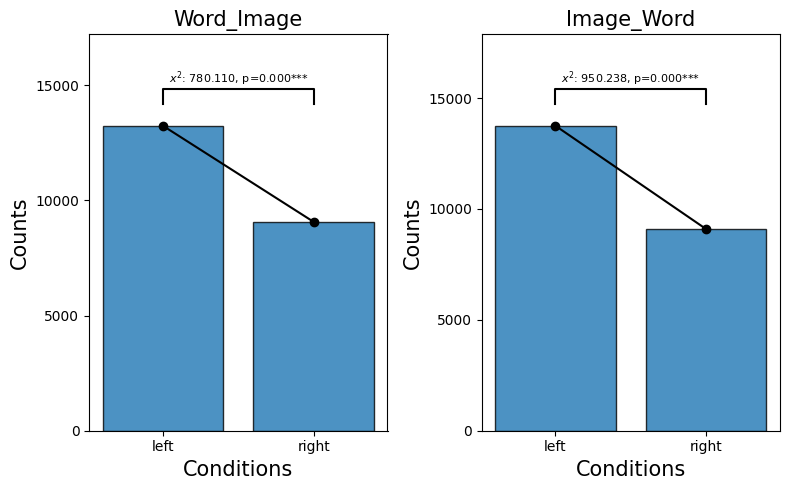

In [702]:
fig = plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)
plt.bar(['word_image_left', 'word_image_right'], [len(word_image_left), len(word_image_right)], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [len(word_image_left), len(word_image_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(word_image_left)*1.07, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(word_image_left)*1.07+len(word_image_left)*0.05+len(word_image_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat1:.3f}, p={p_value1:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=15);
plt.ylabel('Counts', fontsize=15);
plt.title('Word_Image', fontsize=15);

plt.xticks([0, 1], ['left', 'right']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(word_image_left)*1.3])

plt.subplot(1, 2, 2)
plt.bar(['image_word_left', 'image_word_right'], [len(image_word_left), len(image_word_right)], alpha = 0.8,
        edgecolor = 'black');
plt.plot([0, 1], [len(image_word_left), len(image_word_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(image_word_left)*1.07, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(image_word_left)*1.07+len(image_word_left)*0.05+len(image_word_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat2:.3f}, p={p_value2:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=15);
plt.ylabel('Counts', fontsize=15);
plt.title('Image_Word', fontsize=15);

plt.xticks([0, 1], ['left', 'right']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(image_word_left)*1.3])

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure5.png', dpi = 150)

plt.show()

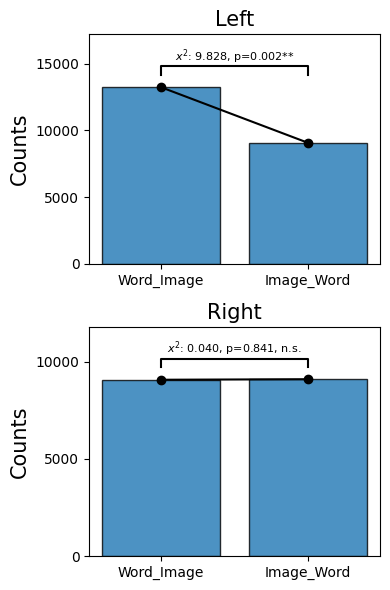

In [405]:
fig = plt.figure(figsize=(4, 6))

plt.subplot(2, 1, 1)
plt.bar([0, 1], [len(word_image_left), len(word_image_right)], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [len(word_image_left), len(word_image_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(word_image_left)*1.07, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07],
    lw = 1.5, c = 'black'
)

if p_value3 < 0.001: star = '***'
elif p_value3 < 0.01: star = '**'
elif p_value3 < 0.05: star = '*'
else: star = 'n.s.'

plt.text(
    0.5,
    (len(word_image_left)*1.07+len(word_image_left)*0.05+len(word_image_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat3:.3f}, p={p_value3:.3f}{star}',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.ylabel('Counts', fontsize=15);
plt.title('Left', fontsize=15);

plt.xticks([0, 1], ['Word_Image', 'Image_Word']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(word_image_left)*1.3])

plt.subplot(2, 1, 2)
plt.bar([0, 1], [len(word_image_right), len(image_word_right)], alpha = 0.8,
        edgecolor = 'black');
plt.plot([0, 1], [len(word_image_right), len(image_word_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(word_image_right)*1.07, len(word_image_right)*1.07+len(word_image_right)*0.05, len(word_image_right)*1.07+len(word_image_right)*0.05, len(word_image_right)*1.07],
    lw = 1.5, c = 'black'
)

if p_value4 < 0.001: star = '***'
elif p_value4 < 0.01: star = '**'
elif p_value4 < 0.05: star = '*'
else: star = 'n.s.'

plt.text(
    0.5,
    (len(word_image_right)*1.07+len(word_image_right)*0.05+len(word_image_right)*0.05)*0.96,
    f'$x^2$: {chi2_stat4:.3f}, p={p_value4:.3f}, {star}',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.ylabel('Counts', fontsize=15);
plt.title('Right', fontsize=15);

plt.xticks([0, 1], ['Word_Image', 'Image_Word']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(word_image_right)*1.3])

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure6.png', dpi = 300)

plt.show()

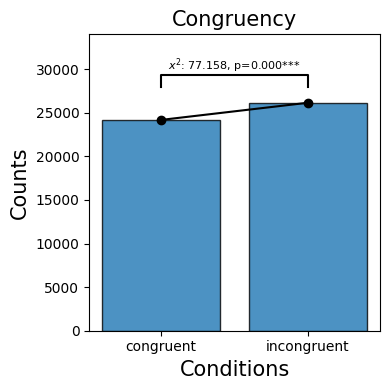

In [534]:
fig = plt.figure(figsize=(4, 4))

plt.bar(['congruent', 'incongruent'], [len(conddata_final[conddata_final['congruency']=='congruent']), len(conddata_final[conddata_final['congruency']=='incongruent'])], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [len(conddata_final[conddata_final['congruency']=='congruent']), len(conddata_final[conddata_final['congruency']=='incongruent'])], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(conddata_final[conddata_final['congruency']=='incongruent'])*1.07, len(conddata_final[conddata_final['congruency']=='incongruent'])*1.07+len(conddata_final[conddata_final['congruency']=='incongruent'])*0.05, len(conddata_final[conddata_final['congruency']=='incongruent'])*1.07+len(conddata_final[conddata_final['congruency']=='incongruent'])*0.05, len(conddata_final[conddata_final['congruency']=='incongruent'])*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(conddata_final[conddata_final['congruency']=='incongruent'])*1.07+len(conddata_final[conddata_final['congruency']=='incongruent'])*0.05+len(conddata_final[conddata_final['congruency']=='incongruent'])*0.05)*0.96,
    f'$x^2$: {chi2_stat5:.3f}, p={p_value5:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=15);
plt.ylabel('Counts', fontsize=15);
plt.title('Congruency', fontsize=15);

plt.xticks([0, 1], ['congruent', 'incongruent']);
plt.ylim([0, len(conddata_final[conddata_final['congruency']=='incongruent'])*1.3])

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure11-1.png', dpi = 150)

plt.show()

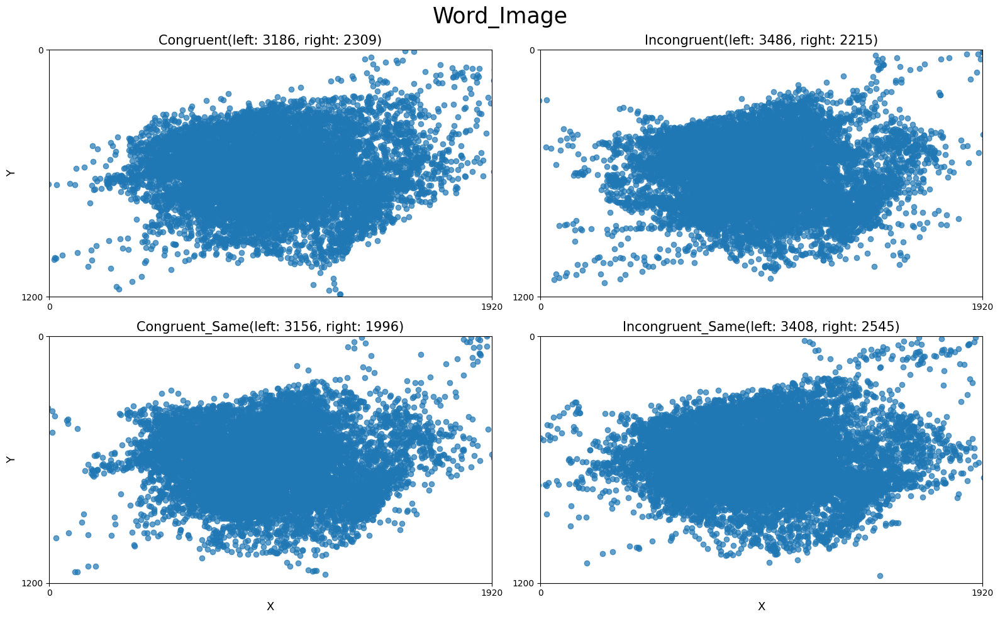

In [703]:
fig = plt.figure(figsize=(16, 10))

plt.subplot(2, 2, 1)
plt.scatter(word_image[word_image['congruency']=='congruent']['x'], word_image[word_image['congruency']=='congruent']['y'],  alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Congruent(left: {len(word_image_left[word_image_left['congruency']=='congruent'])}, right: {len(word_image_right[word_image_right['congruency']=='congruent'])})", fontsize=15)
plt.ylabel('Y', fontsize=13)

plt.subplot(2, 2, 2)
plt.scatter(word_image[word_image['congruency']=='incongruent']['x'], word_image[word_image['congruency']=='incongruent']['y'], alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Incongruent(left: {len(word_image_left[word_image_left['congruency']=='incongruent'])}, right: {len(word_image_right[word_image_right['congruency']=='incongruent'])})", fontsize=15)

plt.subplot(2, 2, 3)
plt.scatter(word_image[word_image['congruency']=='cong_same']['x'], word_image[word_image['congruency']=='cong_same']['y'], alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Congruent_Same(left: {len(word_image_left[word_image_left['congruency']=='cong_same'])}, right: {len(word_image_right[word_image_right['congruency']=='cong_same'])})", fontsize=15)
plt.xlabel('X', fontsize=13)
plt.ylabel('Y', fontsize=13)

plt.subplot(2, 2, 4)
plt.scatter(word_image[word_image['congruency']=='incong_same']['x'], word_image[word_image['congruency']=='incong_same']['y'], alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Incongruent_Same(left: {len(word_image_left[word_image_left['congruency']=='incong_same'])}, right: {len(word_image_right[word_image_right['congruency']=='incong_same'])})", fontsize=15)
plt.xlabel('X', fontsize=13)

plt.suptitle("Word_Image", fontsize = 25)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure6.png', dpi = 150)

plt.show()

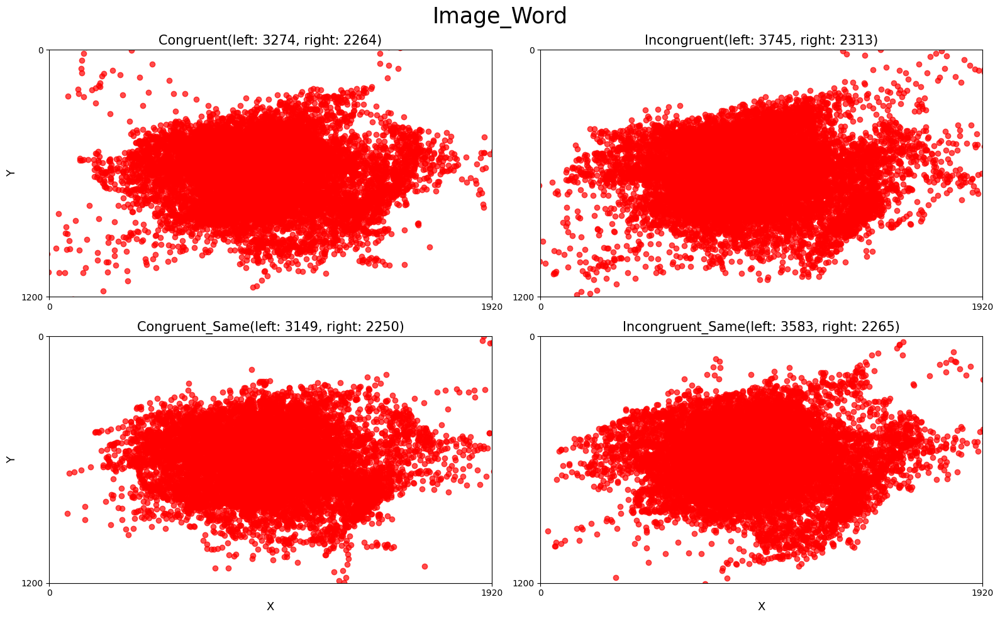

In [704]:
fig = plt.figure(figsize=(16, 10))

plt.subplot(2, 2, 1)
plt.scatter(image_word[image_word['congruency']=='congruent']['x'], image_word[image_word['congruency']=='congruent']['y'],  color = 'red', alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Congruent(left: {len(image_word_left[image_word_left['congruency']=='congruent'])}, right: {len(image_word_right[image_word_right['congruency']=='congruent'])})", fontsize=15)
plt.ylabel('Y', fontsize=13)

plt.subplot(2, 2, 2)
plt.scatter(image_word[image_word['congruency']=='incongruent']['x'], image_word[image_word['congruency']=='incongruent']['y'], color = 'red', alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Incongruent(left: {len(image_word_left[image_word_left['congruency']=='incongruent'])}, right: {len(image_word_right[image_word_right['congruency']=='incongruent'])})", fontsize=15)

plt.subplot(2, 2, 3)
plt.scatter(image_word[image_word['congruency']=='cong_same']['x'], image_word[image_word['congruency']=='cong_same']['y'], color = 'red', alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Congruent_Same(left: {len(image_word_left[image_word_left['congruency']=='cong_same'])}, right: {len(image_word_right[image_word_right['congruency']=='cong_same'])})", fontsize=15)
plt.xlabel('X', fontsize=13)
plt.ylabel('Y', fontsize=13)

plt.subplot(2, 2, 4)
plt.scatter(image_word[image_word['congruency']=='incong_same']['x'], image_word[image_word['congruency']=='incong_same']['y'], color = 'red', alpha = 0.7)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([0, 1200])
plt.gca().invert_yaxis()

plt.title(f"Incongruent_Same(left: {len(image_word_left[image_word_left['congruency']=='incong_same'])}, right: {len(image_word_right[image_word_right['congruency']=='incong_same'])})", fontsize=15)
plt.xlabel('X', fontsize = 13)

plt.suptitle("Image_Word", fontsize = 25)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure7.png', dpi = 150)

plt.show()

In [705]:
word_image_total = len(word_image_left[word_image_left['congruency']=='congruent']) + len(word_image_right[word_image_right['congruency']=='congruent'])
word_image_ob_counts = np.array([len(word_image_left[word_image_left['congruency']=='congruent']), len(word_image_right[word_image_right['congruency']=='congruent'])])
word_image_exp_counts = np.array([word_image_total/2, word_image_total/2])

chi2_stat1, p_value1 = stats.chisquare(word_image_ob_counts, word_image_exp_counts)

print(f'word_image = chi2_stat: {chi2_stat1:.3f}, p_value: {p_value1:.3f}')

image_word_total = len(image_word_left[image_word_left['congruency']=='congruent']) + len(image_word_right[image_word_right['congruency']=='congruent'])
image_word_ob_counts = np.array([len(image_word_left[image_word_left['congruency']=='congruent']), len(image_word_right[image_word_right['congruency']=='congruent'])])
image_word_exp_counts = np.array([image_word_total/2, image_word_total/2])

chi2_stat2, p_value2 = stats.chisquare(image_word_ob_counts, image_word_exp_counts)

print(f'image_word = chi2_stat: {chi2_stat2:.3f}, p_value: {p_value2:.3f}')

word_image_total = len(word_image_left[word_image_left['congruency']=='incongruent']) + len(word_image_right[word_image_right['congruency']=='incongruent'])
word_image_ob_counts = np.array([len(word_image_left[word_image_left['congruency']=='incongruent']), len(word_image_right[word_image_right['congruency']=='incongruent'])])
word_image_exp_counts = np.array([word_image_total/2, word_image_total/2])

chi2_stat3, p_value3 = stats.chisquare(word_image_ob_counts, word_image_exp_counts)

print(f'word_image = chi2_stat: {chi2_stat1:.3f}, p_value: {p_value1:.3f}')

image_word_total = len(image_word_left[image_word_left['congruency']=='incongruent']) + len(image_word_right[image_word_right['congruency']=='incongruent'])
image_word_ob_counts = np.array([len(image_word_left[image_word_left['congruency']=='incongruent']), len(image_word_right[image_word_right['congruency']=='incongruent'])])
image_word_exp_counts = np.array([image_word_total/2, image_word_total/2])

chi2_stat4, p_value4 = stats.chisquare(image_word_ob_counts, image_word_exp_counts)

print(f'image_word = chi2_stat: {chi2_stat2:.3f}, p_value: {p_value2:.3f}')

word_image = chi2_stat: 139.969, p_value: 0.000
image_word = chi2_stat: 184.200, p_value: 0.000
word_image = chi2_stat: 139.969, p_value: 0.000
image_word = chi2_stat: 184.200, p_value: 0.000


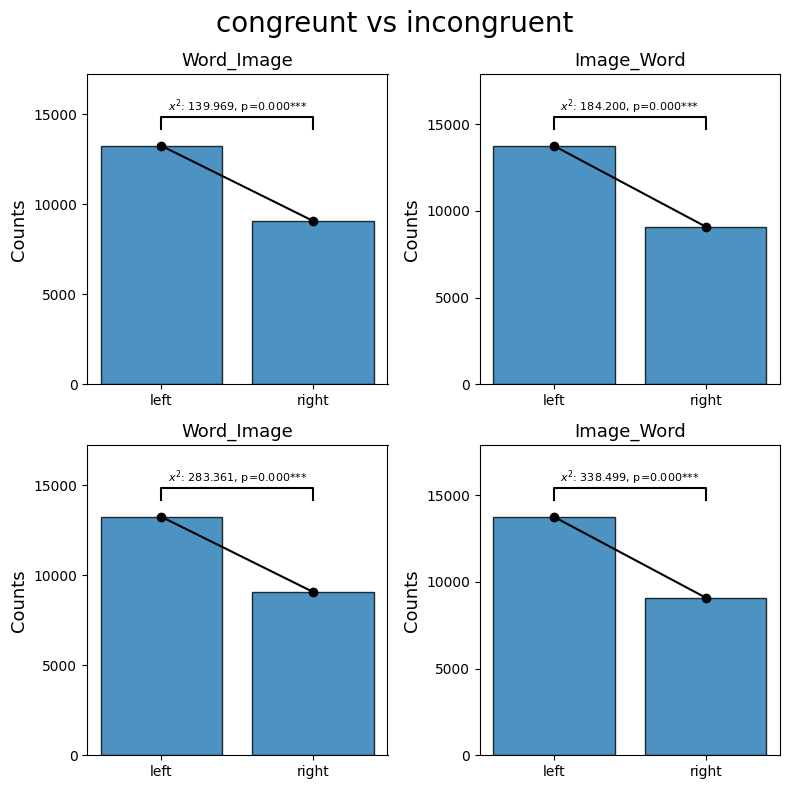

In [706]:
fig = plt.figure(figsize=(8, 8))

plt.subplot(2, 2, 1)
plt.bar(['word_image_left', 'word_image_right'], [len(word_image_left), len(word_image_right)], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [len(word_image_left), len(word_image_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(word_image_left)*1.07, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(word_image_left)*1.07+len(word_image_left)*0.05+len(word_image_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat1:.3f}, p={p_value1:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.ylabel('Counts', fontsize=13);
plt.title('Word_Image', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(word_image_left)*1.3])

plt.subplot(2, 2, 2)
plt.bar(['image_word_left', 'image_word_right'], [len(image_word_left), len(image_word_right)], alpha = 0.8,
        edgecolor = 'black');
plt.plot([0, 1], [len(image_word_left), len(image_word_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(image_word_left)*1.07, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(image_word_left)*1.07+len(image_word_left)*0.05+len(image_word_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat2:.3f}, p={p_value2:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.ylabel('Counts', fontsize=13);
plt.title('Image_Word', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(image_word_left)*1.3])

plt.subplot(2, 2, 3)
plt.bar(['word_image_left', 'word_image_right'], [len(word_image_left), len(word_image_right)], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [len(word_image_left), len(word_image_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(word_image_left)*1.07, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07+len(word_image_left)*0.05, len(word_image_left)*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(word_image_left)*1.07+len(word_image_left)*0.05+len(word_image_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat3:.3f}, p={p_value3:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.ylabel('Counts', fontsize=13);
plt.title('Word_Image', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(word_image_left)*1.3])

plt.subplot(2, 2, 4)
plt.bar(['image_word_left', 'image_word_right'], [len(image_word_left), len(image_word_right)], alpha = 0.8,
        edgecolor = 'black');
plt.plot([0, 1], [len(image_word_left), len(image_word_right)], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [len(image_word_left)*1.07, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07+len(image_word_left)*0.05, len(image_word_left)*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (len(image_word_left)*1.07+len(image_word_left)*0.05+len(image_word_left)*0.05)*0.96,
    f'$x^2$: {chi2_stat4:.3f}, p={p_value4:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.ylabel('Counts', fontsize=13);
plt.title('Image_Word', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.yticks([0, 5000, 10000, 15000])
plt.ylim([0, len(image_word_left)*1.3])

plt.suptitle("congreunt vs incongruent", fontsize = 20)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure10.png', dpi = 150)

plt.show()

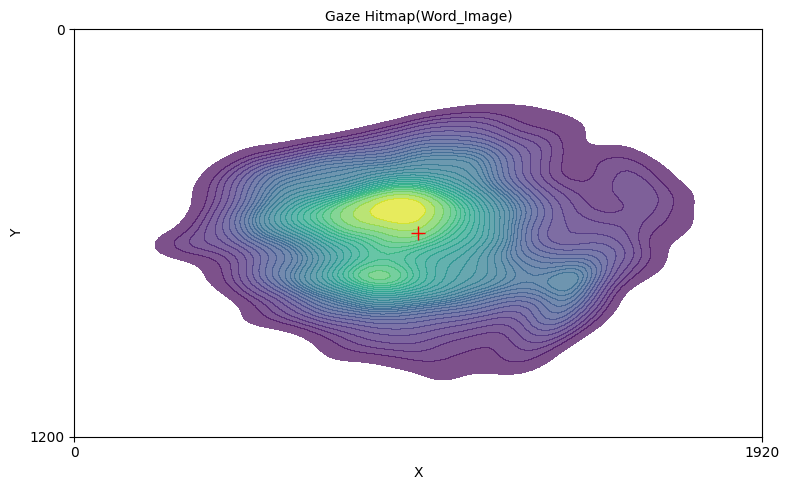

In [707]:
plt.figure(figsize=(8, 5))

sns.kdeplot(
    x=conddata_final[conddata_final['cond_stim'] == 'word_image']['x'], 
    y=conddata_final[conddata_final['cond_stim'] == 'word_image']['y'], 
    fill=True,     
    cmap="viridis", 
    alpha=0.7,
    levels=30,
)

plt.plot(1920/2, 1200/2, marker = "+", color = 'red', markersize = 10)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.gca().invert_yaxis()

plt.title('Gaze Hitmap(Word_Image)', fontsize=10)
plt.xlabel('X')
plt.ylabel('Y')

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure8.png', dpi = 150)

plt.show()


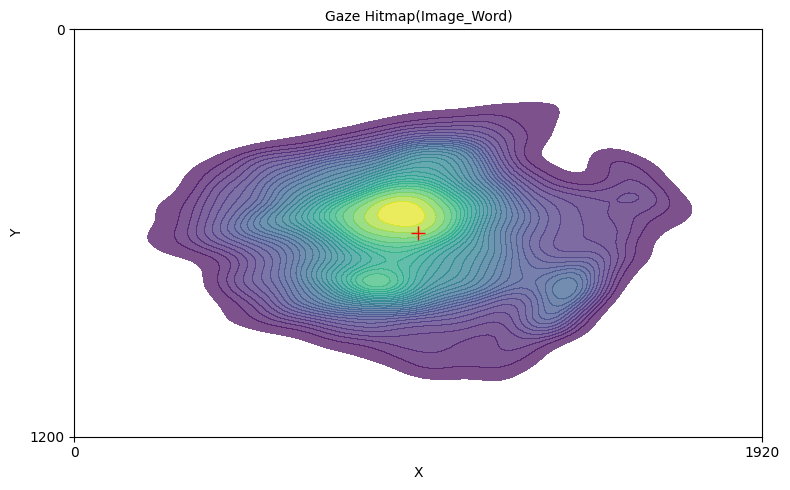

In [708]:
plt.figure(figsize=(8, 5))

sns.kdeplot(
    x=conddata_final[conddata_final['cond_stim'] == 'image_word']['x'],
    y=conddata_final[conddata_final['cond_stim'] == 'image_word']['y'], 
    fill=True,     
    cmap="viridis", 
    alpha=0.7,
    levels=30,
)

plt.plot(1920/2, 1200/2, marker = "+", color = 'red', markersize = 10)

plt.xlim(0, 1920)
plt.ylim(0, 1200)
plt.xticks([0, 1920])
plt.yticks([1200, 0])

plt.gca().invert_yaxis()

plt.title('Gaze Hitmap(Image_Word)', fontsize=10)
plt.xlabel('X')
plt.ylabel('Y')

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure9.png', dpi = 150)

plt.show()

# Eyetracking_data-based machine learning with K-means

In [100]:
image_word_cleaned = image_word.dropna(subset=['x', 'y'])
word_image_cleaned = word_image.dropna(subset=['x', 'y'])

xy_coord1 = word_image_cleaned[['x', 'y']].values
xy_coord2 = image_word_cleaned[['x', 'y']].values

k = 2

kmeans1 = KMeans(n_clusters=k, random_state=42, n_init=10)
word_image_cleaned['cluster'] = kmeans1.fit_predict(xy_coord1);

kmeans2 = KMeans(n_clusters=k, random_state=42, n_init=10)
image_word_cleaned['cluster'] = kmeans2.fit_predict(xy_coord2);

centroids1 = kmeans1.cluster_centers_
centroids2 = kmeans2.cluster_centers_

palette1 = {
    0: 'orange',
    1: 'green'
}

palette2 = {
    0: 'green',
    1: 'orange'
}

for i, center in enumerate(centroids1):
    print(f"군집 {i}: x={center[0]:.2f}, y={center[1]:.2f}, (Total Points: {len(word_image_cleaned[word_image_cleaned['cluster'] == i])})")

for i, center in enumerate(centroids2):
    print(f"군집 {i}: x={center[0]:.2f}, y={center[1]:.2f}, (Total Points: {len(image_word_cleaned[image_word_cleaned['cluster'] == i])})")

군집 0: x=1234.97, y=596.95, (Total Points: 18513)
군집 1: x=754.24, y=607.02, (Total Points: 25405)
군집 0: x=740.03, y=606.76, (Total Points: 25708)
군집 1: x=1198.99, y=602.87, (Total Points: 19446)


C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\482008302.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  word_image_cleaned['cluster'] = kmeans1.fit_predict(xy_coord1);
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\482008302.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  image_word_cleaned['cluster'] = kmeans2.fit_predict(xy_coord2);


In [130]:
from sklearn.metrics import silhouette_score, silhouette_samples

silhouette_avg1 = silhouette_score(xy_coord1, kmeans1.labels_)
silhouette_avg2 = silhouette_score(xy_coord2, kmeans2.labels_)

silhouette_values1 = silhouette_samples(xy_coord1, kmeans1.labels_)
silhouette_values2 = silhouette_samples(xy_coord2, kmeans2.labels_)

print(f"Word_Image: {silhouette_avg1:.4f}")
print(f"Image_word: {silhouette_avg2:.4f}")

Word_Image: 0.4112
Image_word: 0.3915


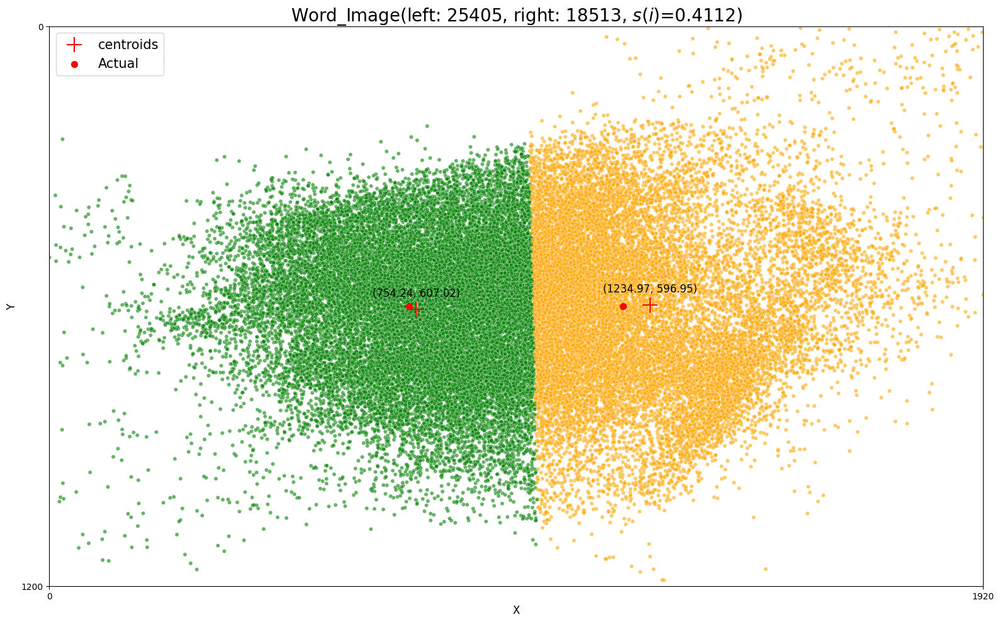

In [710]:
plt.figure(figsize=(16, 10))

sns.scatterplot(
    x='x', 
    y='y', 
    hue='cluster', 
    data=word_image_cleaned, 
    palette=palette1, 
    s=20, 
    alpha=0.6,
    legend = None
)

plt.scatter(
    centroids1[:, 0], 
    centroids1[:, 1], 
    marker='+', 
    s=300, 
    color='red', 
    label='centroids'
)

plt.text(
    centroids1[0, 0], 
    centroids1[0, 1]-35, 
    f"({centroids1[0, 0]:.2f}, {centroids1[0, 1]:.2f})",
    ha='center', 
    va='center', 
    fontsize=12, 
    color='black'
)

plt.text(
    centroids1[1, 0], 
    centroids1[1, 1]-35, 
    f"({centroids1[1, 0]:.2f}, {centroids1[1, 1]:.2f})",
    ha='center', 
    va='center', 
    fontsize=12, 
    color='black'
)

plt.scatter(
    [560+180, 1920-560-180],
    [300+300, 1200-300-300],
    marker='o',
    s=50,
    color='red',
    label = 'Actual'
)

plt.gca().invert_yaxis()

plt.title(f'Word_Image(left: {len(word_image_cleaned[word_image_cleaned["cluster"] == 1])}, right: {len(word_image_cleaned[word_image_cleaned["cluster"] == 0])}, $s(i)$={silhouette_avg1:.4f})', fontsize=20)
plt.xlabel('X', fontsize=12)
plt.ylabel('Y', fontsize=12)

plt.xlim(0, 1920)
plt.ylim(1200, 0)
plt.xticks([0, 1920])
plt.yticks([1200, 0])
plt.legend(fontsize = 15)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure11.png', dpi = 150)

plt.show()

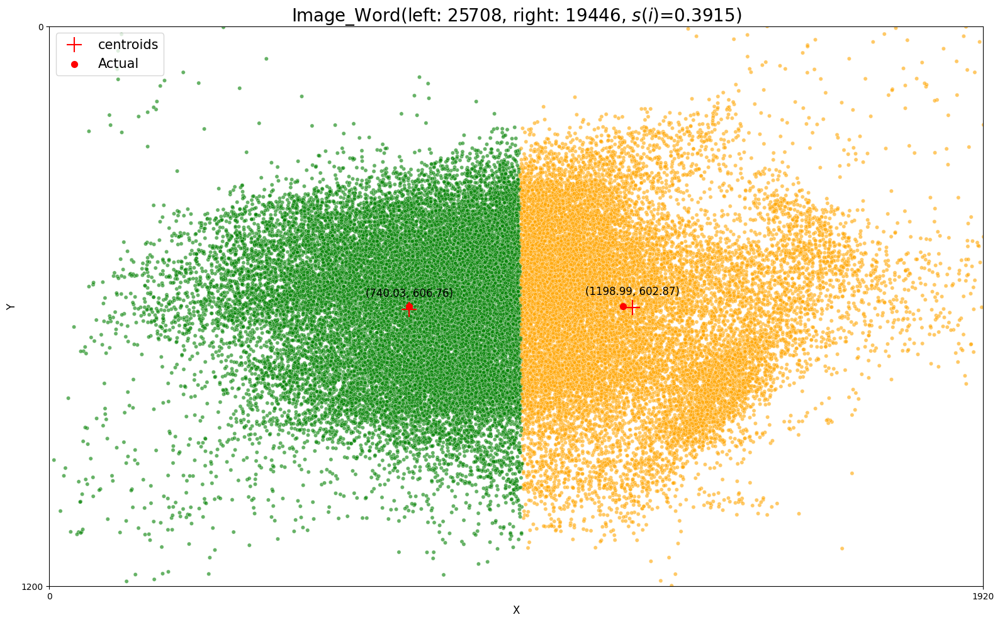

In [711]:
plt.figure(figsize=(16, 10))

sns.scatterplot(
    x='x', 
    y='y', 
    hue='cluster', 
    data=image_word_cleaned, 
    palette=palette2,
    s=20, 
    alpha=0.6,
    legend=None
)

plt.scatter(
    centroids2[:, 0], 
    centroids2[:, 1], 
    marker='+', 
    s=300, 
    color='red', 
    label='centroids'
)

plt.text(
    centroids2[0, 0], 
    centroids2[0, 1]-35, 
    f"({centroids2[0, 0]:.2f}, {centroids2[0, 1]:.2f})",
    ha='center', 
    va='center', 
    fontsize=12, 
    color='black'
)

plt.text(
    centroids2[1, 0], 
    centroids2[1, 1]-35, 
    f"({centroids2[1, 0]:.2f}, {centroids2[1, 1]:.2f})",
    ha='center', 
    va='center', 
    fontsize=12, 
    color='black'
)

plt.scatter(
    [560+180, 1920-560-180],
    [300+300, 1200-300-300],
    marker='o',
    s=50,
    color='red',
    label = 'Actual'
)

plt.gca().invert_yaxis()

plt.title(f'Image_Word(left: {len(image_word_cleaned[image_word_cleaned["cluster"] == 0])}, right: {len(image_word_cleaned[image_word_cleaned["cluster"] == 1])}, $s(i)$={silhouette_avg2:.4f})', fontsize=20)
plt.xlabel('X', fontsize=12)
plt.ylabel('Y', fontsize=12)

plt.xlim(0, 1920)
plt.ylim(1200, 0)
plt.xticks([0, 1920])
plt.yticks([1200, 0])
plt.legend(loc = 'upper left', fontsize = 15)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure12.png', dpi = 150)

plt.show()

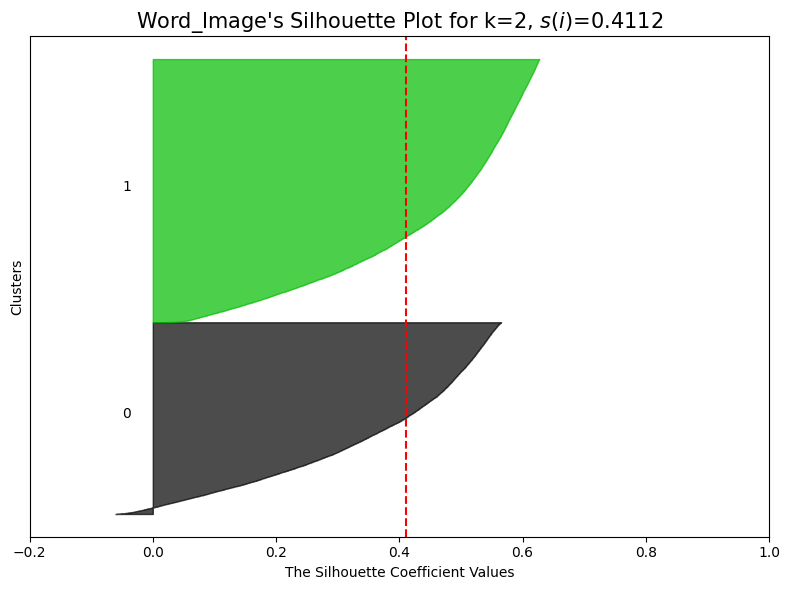

In [715]:
import matplotlib.cm as cm

fig, ax1 = plt.subplots(1, 1, figsize=(8, 6))
y_lower = 10

for i in range(k):
    ith_cluster_silhouette_values = \
        silhouette_values1[kmeans1.labels_ == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / k)
    
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    y_lower = y_upper + 10

ax1.axvline(x=silhouette_avg1, color="red", linestyle="--")

ax1.set_title(f"Word_Image's Silhouette Plot for k={k}, $s(i)$={silhouette_avg1:.4f}", fontsize = 15)
ax1.set_xlabel("The Silhouette Coefficient Values")
ax1.set_ylabel("Clusters")
ax1.set_yticks([])
ax1.set_xticks(np.arange(-0.2, 1.1, 0.2))

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure13.png', dpi = 150)

plt.show()

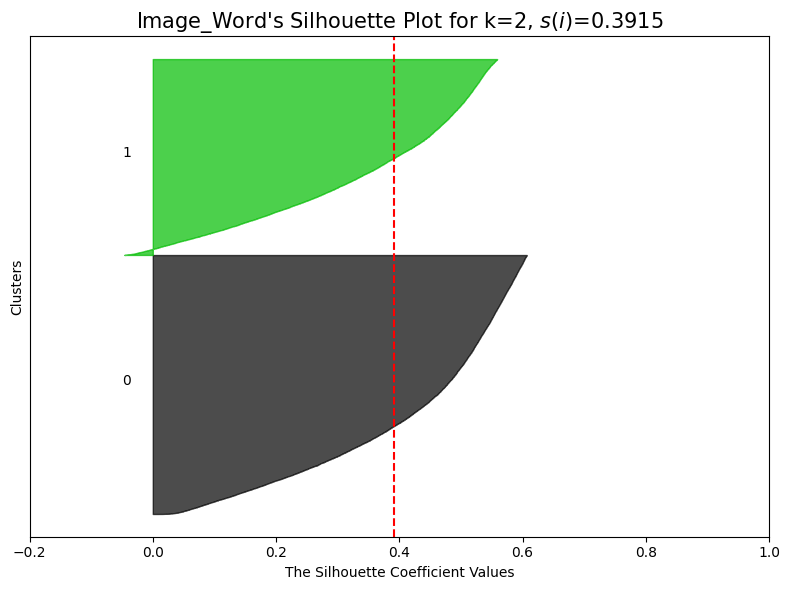

In [716]:
fig, ax1 = plt.subplots(1, 1, figsize=(8, 6))
y_lower = 10

for i in range(k):
    ith_cluster_silhouette_values = \
        silhouette_values2[kmeans2.labels_ == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / k)
    
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    y_lower = y_upper + 10

ax1.axvline(x=silhouette_avg2, color="red", linestyle="--")

ax1.set_title(f"Image_Word's Silhouette Plot for k={k}, $s(i)$={silhouette_avg2:.4f}", fontsize = 15)
ax1.set_xlabel("The Silhouette Coefficient Values")
ax1.set_ylabel("Clusters")
ax1.set_yticks([])
ax1.set_xticks(np.arange(-0.2, 1.1, 0.2))

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure14.png', dpi = 150)

plt.show()

# RT figure with conditions

## experiment1

In [182]:
rt_data1 = pd.read_excel(r"D:\eyetracking\rawdata1.xlsx")
rt_data1.columns = ['ID', 'age', 'sex', 'cong_same/word_image',
       'cong_same/image_word', 'incong_same/word_image',
       'incong_same/image_word', 'congruent/word_image',
       'congruent/image_word', 'incongruent/word_image',
       'incongruent/image_word']
rt_data1.head()

,ID,age,sex,cong_same/word_image,cong_same/image_word,incong_same/word_image,incong_same/image_word,congruent/word_image,congruent/image_word,incongruent/word_image,incongruent/image_word
0,정주원,19,1,1164.31875,1228.18750,1405.26250,1265.48750,1089.90000,1206.54375,1325.00625,1200.33125
1,김생익,19,1,1645.01250,1676.99375,1451.40000,1556.26875,1590.78125,1485.50625,1632.60625,2005.61250
2,이익재,19,1,1019.50625,1039.15000,1253.56250,1143.22500,1278.60625,1164.06875,1082.25625,1354.13125
3,조근영,21,1,951.56875,951.20000,1628.30625,1106.04375,1013.73750,1080.88125,1094.71250,1486.89375
4,이세라,20,2,1329.66875,1545.71875,1718.75000,1449.28125,1315.12500,1396.04375,1510.03750,1714.21250


In [230]:
only_rt = pd.DataFrame(rt_data1.iloc[:, 3:])
only_rt.head()

,cong_same/word_image,cong_same/image_word,incong_same/word_image,incong_same/image_word,congruent/word_image,congruent/image_word,incongruent/word_image,incongruent/image_word
0,1164.31875,1228.18750,1405.26250,1265.48750,1089.90000,1206.54375,1325.00625,1200.33125
1,1645.01250,1676.99375,1451.40000,1556.26875,1590.78125,1485.50625,1632.60625,2005.61250
2,1019.50625,1039.15000,1253.56250,1143.22500,1278.60625,1164.06875,1082.25625,1354.13125
3,951.56875,951.20000,1628.30625,1106.04375,1013.73750,1080.88125,1094.71250,1486.89375
4,1329.66875,1545.71875,1718.75000,1449.28125,1315.12500,1396.04375,1510.03750,1714.21250


In [ ]:
rt_data_mean = np.mean(only_rt, axis = 0)
rt_data_sem = np.std(only_rt, axis = 0) / (len(only_rt)**0.5)
rt_data_ci = stats.t.interval(confidence=0.95, df=len(only_rt)-1 , loc=rt_data_mean, scale=rt_data_sem)

rt_data_ci_lower = rt_data_mean - rt_data_ci[0]
rt_data_ci_upper = rt_data_ci[1] - rt_data_mean

rt_data_ci_list = np.array([rt_data_ci_lower, rt_data_ci_upper])
rt_data_mean.index, rt_data_ci_list

(Index(['cong_same/word_image', 'cong_same/image_word',
        'incong_same/word_image', 'incong_same/image_word',
        'congruent/word_image', 'congruent/image_word',
        'incongruent/word_image', 'incongruent/image_word'],
       dtype='object'),
 array([[186.52388485,  65.32585587,  73.60677034,  82.42774335,
          64.01799563,  63.30653335,  70.91734589, 103.87940915],
        [186.52388485,  65.32585587,  73.60677034,  82.42774335,
          64.01799563,  63.30653335,  70.91734589, 103.87940915]]))

In [634]:
rt_data_ci_list[(0, 1), 2]

array([73.60677034, 73.60677034])

C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\61624852.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot([0, 1], [rt_data_mean[4], rt_data_mean[5]],
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\61624852.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot([0, 1], [rt_data_mean[6], rt_data_mean[7]],
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\61624852.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  

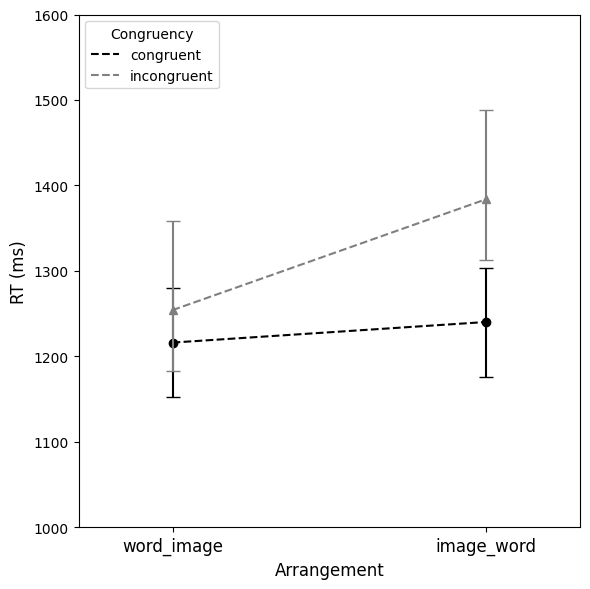

In [652]:
fig = plt.figure(figsize = (6, 6))

plt.plot([0, 1], [rt_data_mean[4], rt_data_mean[5]],
        linestyle = '--', color='black', label = 'congruent')
plt.plot([0, 1], [rt_data_mean[6], rt_data_mean[7]],
        linestyle = '--', color='gray', label = 'incongruent')

plt.plot(0, rt_data_mean[4], marker = 'o', color='black', markersize=6)
plt.plot(0, rt_data_mean[6], marker = '^', color='gray', markersize=6)
plt.plot(1, rt_data_mean[5], marker = 'o', color = 'black', markersize = 6)
plt.plot(1, rt_data_mean[7], marker = '^', color = 'gray', markersize = 6)

plt.errorbar([0, 1], [rt_data_mean[4], rt_data_mean[5]], yerr = [rt_data_ci_list[(0, 1), 4], rt_data_ci_list[(0, 1), 5]],
             fmt = 'none', ecolor='black', capsize=5)
plt.errorbar([0, 1], [rt_data_mean[6], rt_data_mean[7]], yerr = [rt_data_ci_list[(0, 1), 6], rt_data_ci_list[(0, 1), 7]],
             fmt = 'none', ecolor='gray', capsize=5)

plt.xlim(-0.3, 1.3)
plt.ylim((1000, 1600))
plt.xticks([0, 1], ('word_image', 'image_word'), fontsize = 12)

plt.xlabel("Arrangement", fontsize = 12)
plt.ylabel("RT (ms)", fontsize = 12)
plt.legend(title = "Congruency", loc = 'upper left')

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure20.png', dpi = 150)

plt.show()

## experiment 2

In [658]:
rt_data2 = pd.read_excel(r"D:\eyetracking\rawdata2.xlsx")

rt_data2.columns = ['ID', 'age', 'sex', 'congruent/image_word',
       'congruent/word_image', 'incongruent/image_word',
       'incongruent/word_image', 'nonebefore/congruent/image_word',
       'nonebefore/congruent/word_image', 'nonebefore/incongruent/image_word',
       'nonebefore/incongruent/word_image']

rt_data2.head()

,ID,age,sex,congruent/image_word,congruent/word_image,incongruent/image_word,incongruent/word_image,nonebefore/congruent/image_word,nonebefore/congruent/word_image,nonebefore/incongruent/image_word,nonebefore/incongruent/word_image
0,정주원,19,1,0.9375,1.0000,0.0000,0.0000,0.0625,0.0000,1.0000,0.875
1,김생익,19,1,1.0000,1.0000,0.0625,0.0000,0.1875,0.0000,1.0000,1.000
2,이익재,19,1,1.0000,0.8750,0.3750,0.2500,0.8750,0.9375,1.0000,1.000
3,조근영,21,1,0.6875,0.6875,0.5625,0.1875,0.6250,0.7500,0.9375,0.875
4,이세라,20,2,0.9375,0.8750,0.5000,0.6250,0.9375,0.8125,1.0000,1.000


In [665]:
only_accu = pd.DataFrame(rt_data2.iloc[2:, 3:])
only_accu.head()

,congruent/image_word,congruent/word_image,incongruent/image_word,incongruent/word_image,nonebefore/congruent/image_word,nonebefore/congruent/word_image,nonebefore/incongruent/image_word,nonebefore/incongruent/word_image
2,1.0000,0.8750,0.3750,0.2500,0.8750,0.9375,1.0000,1.000
3,0.6875,0.6875,0.5625,0.1875,0.6250,0.7500,0.9375,0.875
4,0.9375,0.8750,0.5000,0.6250,0.9375,0.8125,1.0000,1.000
5,0.8125,0.9375,0.3750,0.4375,0.9375,0.8750,1.0000,1.000
6,1.0000,0.9375,0.7500,0.8750,0.9375,0.8125,1.0000,1.000


In [666]:
accu_data_mean = np.mean(only_accu, axis = 0)
accu_data_sem = np.std(only_accu, axis = 0) / (len(only_accu)**0.5)
accu_data_ci = stats.t.interval(confidence=0.95, df=len(only_accu)-1 , loc=accu_data_mean, scale=accu_data_sem)

accu_data_ci_lower = accu_data_mean - accu_data_ci[0]
accu_data_ci_upper = accu_data_ci[1] - accu_data_mean

accu_data_ci_list = np.array([accu_data_ci_lower, accu_data_ci_upper])
accu_data_mean.index, accu_data_ci_list

(Index(['congruent/image_word', 'congruent/word_image',
        'incongruent/image_word', 'incongruent/word_image',
        'nonebefore/congruent/image_word', 'nonebefore/congruent/word_image',
        'nonebefore/incongruent/image_word',
        'nonebefore/incongruent/word_image'],
       dtype='object'),
 array([[0.03657925, 0.042939  , 0.08045789, 0.07786738, 0.04657104,
         0.03329433, 0.01650529, 0.01519981],
        [0.03657925, 0.042939  , 0.08045789, 0.07786738, 0.04657104,
         0.03329433, 0.01650529, 0.01519981]]))

C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\1339939990.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot([0, 1], [accu_data_mean[1], accu_data_mean[5]],
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\1339939990.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot([0, 1], [accu_data_mean[3], accu_data_mean[7]],
C:\Users\csw10\AppData\Local\Temp\ipykernel_7132\1339939990.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `se

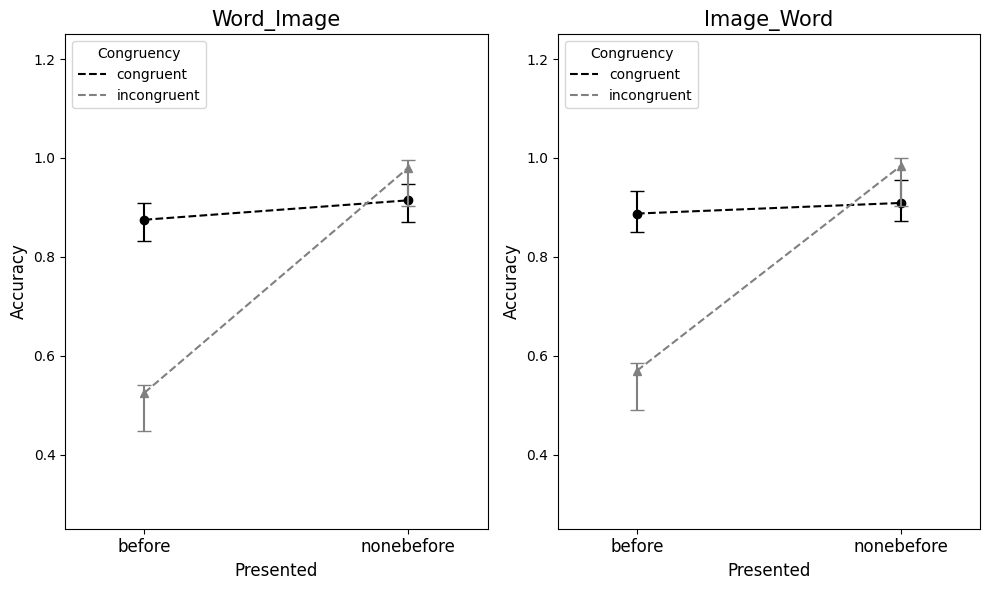

In [681]:
fig = plt.figure(figsize = (10, 6))

plt.subplot(1, 2, 1)

plt.plot([0, 1], [accu_data_mean[1], accu_data_mean[5]],
        linestyle = '--', color='black', label = 'congruent')
plt.plot([0, 1], [accu_data_mean[3], accu_data_mean[7]],
        linestyle = '--', color='gray', label = 'incongruent')

plt.plot(0, accu_data_mean[1], marker = 'o', color='black', markersize=6)
plt.plot(0, accu_data_mean[3], marker = '^', color='gray', markersize=6)
plt.plot(1, accu_data_mean[5], marker = 'o', color = 'black', markersize = 6)
plt.plot(1, accu_data_mean[7], marker = '^', color = 'gray', markersize = 6)

plt.errorbar([0, 1], [accu_data_mean[1], accu_data_mean[5]], yerr = [accu_data_ci_list[(0, 1), 1], accu_data_ci_list[(0, 1), 5]],
             fmt = 'none', ecolor='black', capsize=5)
plt.errorbar([0, 1], [accu_data_mean[3], accu_data_mean[7]], yerr = [accu_data_ci_list[(0, 1), 3], accu_data_ci_list[(0, 1), 7]],
             fmt = 'none', ecolor='gray', capsize=5)

plt.xlim(-0.3, 1.3)
plt.ylim((0.25, 1.25))
plt.xticks([0, 1], ('before', 'nonebefore'), fontsize = 12)

plt.title("Word_Image", fontsize = 15)
plt.xlabel("Presented", fontsize = 12)
plt.ylabel("Accuracy", fontsize = 12)
plt.legend(title = "Congruency", loc = 'upper left')

plt.subplot(1, 2, 2)

plt.plot([0, 1], [accu_data_mean[0], accu_data_mean[4]],
        linestyle = '--', color='black', label = 'congruent')
plt.plot([0, 1], [accu_data_mean[2], accu_data_mean[6]],
        linestyle = '--', color='gray', label = 'incongruent')

plt.plot(0, accu_data_mean[0], marker = 'o', color='black', markersize=6)
plt.plot(0, accu_data_mean[2], marker = '^', color='gray', markersize=6)
plt.plot(1, accu_data_mean[4], marker = 'o', color = 'black', markersize = 6)
plt.plot(1, accu_data_mean[6], marker = '^', color = 'gray', markersize = 6)

plt.errorbar([0, 1], [accu_data_mean[0], accu_data_mean[4]], yerr = [accu_data_ci_list[(0, 1), 0], accu_data_ci_list[(0, 1), 4]],
             fmt = 'none', ecolor='black', capsize=5)
plt.errorbar([0, 1], [accu_data_mean[2], accu_data_mean[6]], yerr = [accu_data_ci_list[(0, 1), 2], accu_data_ci_list[(0, 1), 6]],
             fmt = 'none', ecolor='gray', capsize=5)

plt.xlim(-0.3, 1.3)
plt.ylim((0.25, 1.25))
plt.xticks([0, 1], ('before', 'nonebefore'), fontsize = 12)

plt.title("Image_Word", fontsize = 15)
plt.xlabel("Presented", fontsize = 12)
plt.ylabel("Accuracy", fontsize = 12)
plt.legend(title = "Congruency", loc = 'upper left')

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure21.png', dpi = 150)

plt.show()

# T-tests with gaze data

In [426]:
from scipy import stats
import pandas as pd
import numpy as np
import seaborn as sns

In [427]:
conddata_final_sorted = conddata_final.sort_values(by=['time'])
conddata_final_sorted = conddata_final_sorted.dropna()

conddata_final_sorted['gaze_time'] = conddata_final_sorted['time'].diff()
conddata_final_gaze = conddata_final_sorted.dropna(subset=['gaze_time'])

word_image_time = conddata_final_gaze[conddata_final_gaze['cond_stim'] == 'word_image']
image_word_time = conddata_final_gaze[conddata_final_gaze['cond_stim'] == 'image_word']

In [428]:
x1min = 560
x1max = x1min + 360
y1min = 300 + 120
y1max = y1min + 360

x2min = x1max + 80
x2max = x2min + 360
y2min = y1min
y2max = y1max

word_imagetimex_left = (word_image_time['x'] >= x1min) & (word_image_time['x'] <= x1max)
word_imagetimey_left = (word_image_time['y'] >= y1min) & (word_image_time['y'] <= y1max)
word_imagetimex_right = (word_image_time['x'] >= x2min) & (word_image_time['x'] <= x2max)
word_imagetimey_right = (word_image_time['y'] >= y2min) & (word_image_time['y'] <= y2max)

image_wordtimex_left = (image_word_time['x'] >= x1min) & (image_word_time['x'] <= x1max)
image_wordtimey_left = (image_word_time['y'] >= y1min) & (image_word_time['y'] <= y1max)
image_wordtimex_right = (image_word_time['x'] >= x2min) & (image_word_time['x'] <= x2max)
image_wordtimey_right = (image_word_time['y'] >= y2min) & (image_word_time['y'] <= y2max)

word_imagetime_left = word_image_time[word_imagetimex_left & word_imagetimey_left]
word_imagetime_right = word_image_time[word_imagetimex_right & word_imagetimey_right]
image_wordtime_left = image_word_time[image_wordtimex_left & image_wordtimey_left]
image_wordtime_right = image_word_time[image_wordtimex_right & image_wordtimey_right]

In [429]:
word_imagetime_left

,trial_index,stimulus_url,congruency,response,reaction_time,cond_stim,x,y,time,gaze_time
80899,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1779.9,word_image,804.706477,665.014476,41436.0,55.2
80900,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1779.9,word_image,852.038436,685.283119,41494.8,58.8
80901,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1779.9,word_image,847.362973,649.578934,41542.6,47.8
80902,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1779.9,word_image,886.662892,643.288850,41590.0,47.4
80903,0,https://Choiseonwoo927.github.io/Eyetracking/c...,incongruent,/,1779.9,word_image,889.175235,636.334136,41645.3,55.3
...,...,...,...,...,...,...,...,...,...,...
2684,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1075.0,word_image,737.833018,468.885100,355596.6,42.8
2685,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1075.0,word_image,751.117600,467.394309,355654.0,57.4
2686,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1075.0,word_image,793.255039,466.175611,355701.9,47.9
2687,123,https://Choiseonwoo927.github.io/Eyetracking/c...,incong_same,/,1075.0,word_image,839.063705,471.384335,355745.4,43.5


In [688]:
levene_stat, levene_p = stats.levene(word_imagetime_left['gaze_time'], word_imagetime_right['gaze_time'])

print(f"Levene's p-value: {levene_p:.3f}") # p >= 0.05: equal variance, p < 0.05: unequal variance

t_stat, p_value = stats.ttest_ind(word_imagetime_left['gaze_time'], word_imagetime_right['gaze_time'], equal_var=False) # Welch's t-test

print(f't: {t_stat:.3f}')
print(f'p-value: {p_value:.3f}')

Levene's p-value: 0.000
t: 14.480
p-value: 0.000


In [689]:
levene_stat, levene_p = stats.levene(image_wordtime_left['gaze_time'], image_wordtime_right['gaze_time'])

print(f"Levene's p-value: {levene_p:.3f}")

t_stat1, p_value1 = stats.ttest_ind(image_wordtime_left['gaze_time'], image_wordtime_right['gaze_time'], equal_var=False) # Welch's t-test

print(f't: {t_stat1:.3f}')
print(f'p-value: {p_value1:.3f}')

Levene's p-value: 0.000
t: 17.224
p-value: 0.000


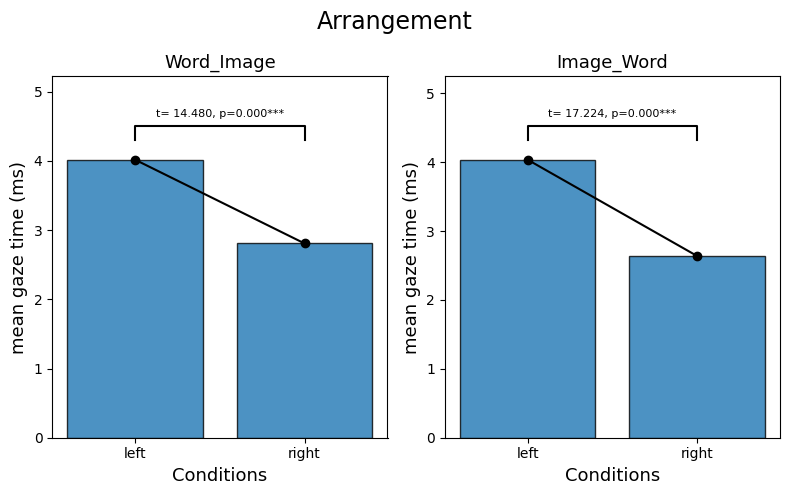

In [693]:
fig = plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)

plt.bar(['left', 'right'], [word_imagetime_left['gaze_time'].mean(), word_imagetime_right['gaze_time'].mean()], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [word_imagetime_left['gaze_time'].mean(), word_imagetime_right['gaze_time'].mean()], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [word_imagetime_left['gaze_time'].mean()*1.07, word_imagetime_left['gaze_time'].mean()*1.07+word_imagetime_left['gaze_time'].mean()*0.05, word_imagetime_left['gaze_time'].mean()*1.07+word_imagetime_left['gaze_time'].mean()*0.05, word_imagetime_left['gaze_time'].mean()*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (word_imagetime_left['gaze_time'].mean()*1.07+word_imagetime_left['gaze_time'].mean()*0.05+word_imagetime_left['gaze_time'].mean()*0.05)*0.98,
    f't= {t_stat:.3f}, p={p_value:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Word_Image', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.ylim([0, word_imagetime_left['gaze_time'].mean()*1.3])

plt.subplot(1, 2, 2)

plt.bar(['left', 'right'], [image_wordtime_left['gaze_time'].mean(), image_wordtime_right['gaze_time'].mean()], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [image_wordtime_left['gaze_time'].mean(), image_wordtime_right['gaze_time'].mean()], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [image_wordtime_left['gaze_time'].mean()*1.07, image_wordtime_left['gaze_time'].mean()*1.07+image_wordtime_left['gaze_time'].mean()*0.05, image_wordtime_left['gaze_time'].mean()*1.07+image_wordtime_left['gaze_time'].mean()*0.05, image_wordtime_left['gaze_time'].mean()*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (image_wordtime_left['gaze_time'].mean()*1.07+image_wordtime_left['gaze_time'].mean()*0.05+image_wordtime_left['gaze_time'].mean()*0.05)*0.98,
    f't= {t_stat1:.3f}, p={p_value1:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Image_Word', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.ylim([0, image_wordtime_left['gaze_time'].mean()*1.3])

plt.suptitle("Arrangement", fontsize = 17)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure15.png', dpi = 150)

plt.show()

### figure list

1. congruency -> cong / incong -> wi / iw -> left > right
2. congruency -> cong < incong

### another list

1. to explain figure
2. to search previous paper

In [449]:
wi_time_cong_l = word_imagetime_left[word_imagetime_left['congruency']=='congruent']['gaze_time']
wi_time_cong_r = word_imagetime_right[word_imagetime_right['congruency']=='congruent']['gaze_time']

wi_time_incong_l = word_imagetime_left[word_imagetime_left['congruency']=='incongruent']['gaze_time']
wi_time_incong_r = word_imagetime_right[word_imagetime_right['congruency']=='incongruent']['gaze_time']

iw_time_cong_l = image_wordtime_left[image_wordtime_left['congruency']=='congruent']['gaze_time']
iw_time_cong_r = image_wordtime_right[image_wordtime_right['congruency']=='congruent']['gaze_time']

iw_time_incong_l = image_wordtime_left[image_wordtime_left['congruency']=='incongruent']['gaze_time']
iw_time_incong_r = image_wordtime_right[image_wordtime_right['congruency']=='incongruent']['gaze_time']

In [602]:
levene_stat, levene_p = stats.levene(wi_time_cong_l, wi_time_cong_r)

print(f"Levene's p-value: {levene_p:.3f}")

t_stat, p_value = stats.ttest_ind(wi_time_cong_l, wi_time_cong_r, equal_var=False) # Welch's t-test

print(f't: {t_stat:.3f}')
print(f'p-value: {p_value:.3f}')

Levene's p-value: 0.000
t: 6.128
p-value: 0.000


In [603]:
levene_stat, levene_p = stats.levene(iw_time_cong_l, iw_time_cong_r)

print(f"Levene's p-value: {levene_p:.3f}")

t_stat1, p_value1 = stats.ttest_ind(iw_time_cong_l, iw_time_cong_r, equal_var=False) # Welch's t-test

print(f't: {t_stat1:.3f}')
print(f'p-value: {p_value1:.3f}')

Levene's p-value: 0.000
t: 8.857
p-value: 0.000


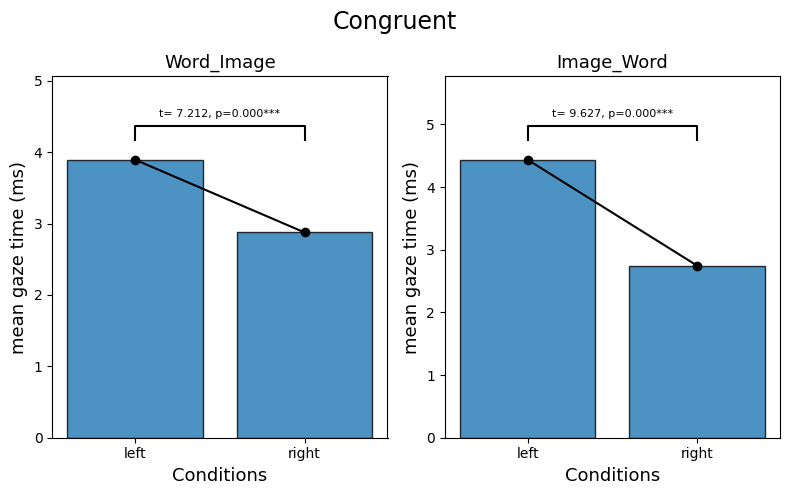

In [684]:
fig = plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)

plt.bar(['left', 'right'], [wi_time_cong_l.mean(), wi_time_cong_r.mean()], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [wi_time_cong_l.mean(), wi_time_cong_r.mean()], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [wi_time_cong_l.mean()*1.07, wi_time_cong_l.mean()*1.07+wi_time_cong_l.mean()*0.05, wi_time_cong_l.mean()*1.07+wi_time_cong_l.mean()*0.05, wi_time_cong_l.mean()*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (wi_time_cong_l.mean()*1.07+wi_time_cong_l.mean()*0.05+wi_time_cong_l.mean()*0.05)*0.98,
    f't= {t_stat:.3f}, p={p_value:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Word_Image', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.ylim([0, wi_time_cong_l.mean()*1.3])

plt.subplot(1, 2, 2)

plt.bar(['left', 'right'], [iw_time_cong_l.mean(), iw_time_cong_r.mean()], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [iw_time_cong_l.mean(), iw_time_cong_r.mean()], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [iw_time_cong_l.mean()*1.07, iw_time_cong_l.mean()*1.07+iw_time_cong_l.mean()*0.05, iw_time_cong_l.mean()*1.07+iw_time_cong_l.mean()*0.05, iw_time_cong_l.mean()*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (iw_time_cong_l.mean()*1.07+iw_time_cong_l.mean()*0.05+iw_time_cong_l.mean()*0.05)*0.98,
    f't= {t_stat1:.3f}, p={p_value1:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Image_Word', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.ylim([0, iw_time_cong_l.mean()*1.3])

plt.suptitle("Congruent", fontsize = 17)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure17.png', dpi = 150)

plt.show()

In [605]:
levene_stat, levene_p = stats.levene(wi_time_incong_l, wi_time_incong_r)

print(f"Levene's p-value: {levene_p:.3f}")

t_stat, p_value = stats.ttest_ind(wi_time_incong_l, wi_time_incong_r, equal_var=False) # Welch's t-test

print(f't: {t_stat:.3f}')
print(f'p-value: {p_value:.3f}')

Levene's p-value: 0.000
t: 7.212
p-value: 0.000


In [606]:
levene_stat, levene_p = stats.levene(iw_time_incong_l, iw_time_incong_r)

print(f"Levene's p-value: {levene_p:.3f}")

t_stat1, p_value1 = stats.ttest_ind(iw_time_incong_l, iw_time_incong_r, equal_var=False) # Welch's t-test

print(f't: {t_stat1:.3f}')
print(f'p-value: {p_value1:.3f}')

Levene's p-value: 0.000
t: 9.627
p-value: 0.000


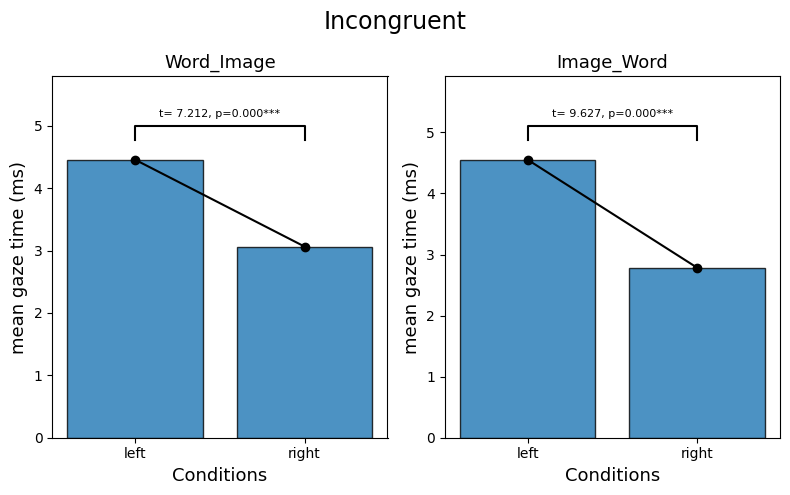

In [685]:
fig = plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)

plt.bar(['left', 'right'], [wi_time_incong_l.mean(), wi_time_incong_r.mean()], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [wi_time_incong_l.mean(), wi_time_incong_r.mean()], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [wi_time_incong_l.mean()*1.07, wi_time_incong_l.mean()*1.07+wi_time_incong_l.mean()*0.05, wi_time_incong_l.mean()*1.07+wi_time_incong_l.mean()*0.05, wi_time_incong_l.mean()*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (wi_time_incong_l.mean()*1.07+wi_time_incong_l.mean()*0.05+wi_time_incong_l.mean()*0.05)*0.98,
    f't= {t_stat:.3f}, p={p_value:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Word_Image', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.ylim([0, wi_time_incong_l.mean()*1.3])

plt.subplot(1, 2, 2)

plt.bar(['left', 'right'], [iw_time_incong_l.mean(), iw_time_incong_r.mean()], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [iw_time_incong_l.mean(), iw_time_incong_r.mean()], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [iw_time_incong_l.mean()*1.07, iw_time_incong_l.mean()*1.07+iw_time_incong_l.mean()*0.05, iw_time_incong_l.mean()*1.07+iw_time_incong_l.mean()*0.05, iw_time_incong_l.mean()*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (iw_time_incong_l.mean()*1.07+iw_time_incong_l.mean()*0.05+iw_time_incong_l.mean()*0.05)*0.98,
    f't= {t_stat1:.3f}, p={p_value1:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Image_Word', fontsize=13);

plt.xticks([0, 1], ['left', 'right']);
plt.ylim([0, iw_time_incong_l.mean()*1.3])

plt.suptitle("Incongruent", fontsize = 17)

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure18.png', dpi = 150)

plt.show()

In [ ]:
levene_stat, levene_p = stats.levene(wi_time_incong_l, wi_time_incong_r)

print(f"Levene's p-value: {levene_p:.3f}")

t_stat, p_value = stats.ttest_ind(wi_time_incong_l, wi_time_incong_r, equal_var=False) # Welch's t-test

print(f't: {t_stat:.3f}')
print(f'p-value: {p_value:.3f}')

In [481]:
levene_stat, levene_p = stats.levene(conddata_final_gaze[conddata_final_gaze['congruency']=='congruent']['gaze_time'], conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])

print(f"Levene's p-value: {levene_p:.3f}")

t_stat, p_value = stats.ttest_ind(conddata_final_gaze[conddata_final_gaze['congruency']=='congruent']['gaze_time'], conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'], equal_var=False) # Welch's t-test

print(f't: {t_stat:.3f}')
print(f'p-value: {p_value:.3f}')

Levene's p-value: 0.002
t: -3.509
p-value: 0.000


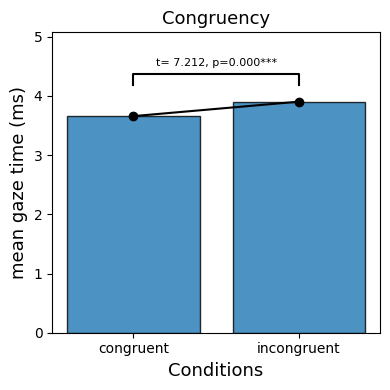

In [619]:
fig = plt.figure(figsize=(4, 4))

plt.bar(['congruent', 'incongruent'], [np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='congruent']['gaze_time']), np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])], alpha = 0.8, 
        edgecolor = 'black');
plt.plot([0, 1], [np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='congruent']['gaze_time']), np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])], 'o-', color='black')

plt.plot(
    [0, 0, 1, 1],
    [np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*1.07, np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*1.07+np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*0.05, np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*1.07+np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*0.05, np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*1.07],
    lw = 1.5, c = 'black'
)

plt.text(
    0.5,
    (np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*1.07+np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*0.05+np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*0.05)*0.98,
    f't= {t_stat:.3f}, p={p_value:.3f}***',
    ha = 'center',
    va = 'bottom',
    fontsize = 8,
    color = 'black'
)

plt.xlabel('Conditions', fontsize=13);
plt.ylabel('mean gaze time (ms)', fontsize=13);
plt.title('Congruency', fontsize=13);

plt.xticks([0, 1], ['congruent', 'incongruent']);
plt.ylim([0, np.mean(conddata_final_gaze[conddata_final_gaze['congruency']=='incongruent']['gaze_time'])*1.3])

plt.tight_layout()
plt.savefig(r'D:\eyetracking\figure\figure19.png', dpi = 150)

plt.show()